<a href="https://colab.research.google.com/github/LazImane/TER_Images/blob/main/cnn_etape2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Étape 2 : Premier modèle CNN - Baseline et variations

## Contexte et objectifs

Ce notebook constitue notre première expérimentation avec les CNN (Convolutional Neural Networks) pour la classification d'images. Nous travaillons sur un problème de **classification binaire** : distinguer les éléphants des autres animaux.

**Dataset :** 200 images (100 éléphants, 100 non-éléphants) redimensionnées en 128×128 pixels

## Plan du notebook

### Partie 1 : Baseline simple
- Créer un CNN minimal (1 Conv + 1 Pool + Dense)
- Entraîner et observer les courbes de loss/accuracy
- Évaluer les performances sur le test set

### Partie 2 : Variations d'hyperparamètres
Tester l'impact de :
- Plus d'epochs (60 au lieu de 30)
- Learning rate différent (1e-4 au lieu de 1e-3)
- Batch size différent (16 au lieu de 32)

### Partie 3 : Modèle complexe (overfitting)
- Créer un CNN avec 3 blocs Conv + régularisation forte
- Observer l'overfitting sévère (pour comprendre le phénomène)

### Partie 4 : Modèle amélioré optimisé
- Simplifier l'architecture pour notre petit dataset
- Trouver le bon équilibre entre performance et généralisation

### Partie 5 : Analyse comparative
- Comparer tous les modèles
- Tirer des conclusions sur les meilleurs choix

## 1. Imports et configuration

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
from os import listdir
from os.path import isfile, join
import random

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

import tensorflow as tf
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

import zipfile
import os

# Fixer les graines pour reproductibilité
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

print("TensorFlow version:", tf.__version__)
print("GPU disponible:", "Oui" if tf.config.list_physical_devices('GPU') else "Non")

TensorFlow version: 2.19.0
GPU disponible: Non


## 2. Chargement et préparation des données

**Important :** Remplace les chemins par tes propres données

In [6]:
# Télécharger le dataset
print("Téléchargement du dataset...")
zip_file = "Tiger-Fox-Elephant.zip"
!wget https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip

# Extraire
print("Extraction des données...")
with zipfile.ZipFile(zip_file, "r") as zip_ref:
    zip_ref.extractall("Data_Project")

# Supprimer le zip pour économiser l'espace
os.remove(zip_file)
print("Dataset prêt !")

# Configuration
IMG_SIZE = 128  # Taille des images

# Chemin vers les données
DATA_PATH = "Data_Project/Tiger-Fox-Elephant/"
CLASSES = ['elephant', 'Elephant_negative_class']

print(f"\nChemin des données : {DATA_PATH}")
print(f"Classes à classifier : {CLASSES}")

Téléchargement du dataset...
--2026-03-22 12:58:12--  https://www.lirmm.fr/~poncelet/Ressources/Tiger-Fox-Elephant.zip
Resolving www.lirmm.fr (www.lirmm.fr)... 193.49.104.251
Connecting to www.lirmm.fr (www.lirmm.fr)|193.49.104.251|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7605545 (7.3M) [application/zip]
Saving to: ‘Tiger-Fox-Elephant.zip’

Tiger-Fox-Elephant. 100%[===================>]   7.25M  6.97MB/s    in 1.0s    

2026-03-22 12:58:13 (6.97 MB/s) - ‘Tiger-Fox-Elephant.zip’ saved [7605545/7605545]

Extraction des données...
Dataset prêt !

Chemin des données : Data_Project/Tiger-Fox-Elephant/
Classes à classifier : ['elephant', 'Elephant_negative_class']


In [8]:
def create_training_data(path_data, list_classes, img_size=128):
    """
    Charge et redimensionne les images depuis les dossiers.
    """
    training_data = []

    for classes in list_classes:
        path = os.path.join(path_data, classes)
        class_num = list_classes.index(classes)

        print(f"Chargement de la classe {classes} (label {class_num})...")

        for img in os.listdir(path):
            try:
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_UNCHANGED)
                new_array = cv2.resize(img_array, (img_size, img_size))
                training_data.append([new_array, class_num])
            except Exception as e:
                pass

    print(f"Total d'images chargées : {len(training_data)}")
    return training_data

def create_X_y(path_data, list_classes, img_size=128):
    """
    Crée X (images) et y (labels) à partir des données.
    """
    # Récupération des données
    training_data = create_training_data(path_data, list_classes, img_size)

    # Mélange aléatoire
    random.shuffle(training_data)

    # Séparation X et y
    X = []
    y = []
    for features, label in training_data:
        X.append(features)
        y.append(label)

    X = np.array(X).reshape(-1, img_size, img_size, 3)
    y = np.array(y)

    return X, y

In [9]:
# Chargement des données
X, y = create_X_y(DATA_PATH, CLASSES, IMG_SIZE)

print("\n=== Informations sur les données ===")
print(f"X.shape: {X.shape}")
print(f"y.shape: {y.shape}")
print(f"Distribution des classes:")
unique, counts = np.unique(y, return_counts=True)
for u, c in zip(unique, counts):
    print(f"  Classe {u}: {c} images ({c/len(y)*100:.1f}%)")

Chargement de la classe elephant (label 0)...
Chargement de la classe Elephant_negative_class (label 1)...
Total d'images chargées : 200

=== Informations sur les données ===
X.shape: (200, 128, 128, 3)
y.shape: (200,)
Distribution des classes:
  Classe 0: 100 images (50.0%)
  Classe 1: 100 images (50.0%)


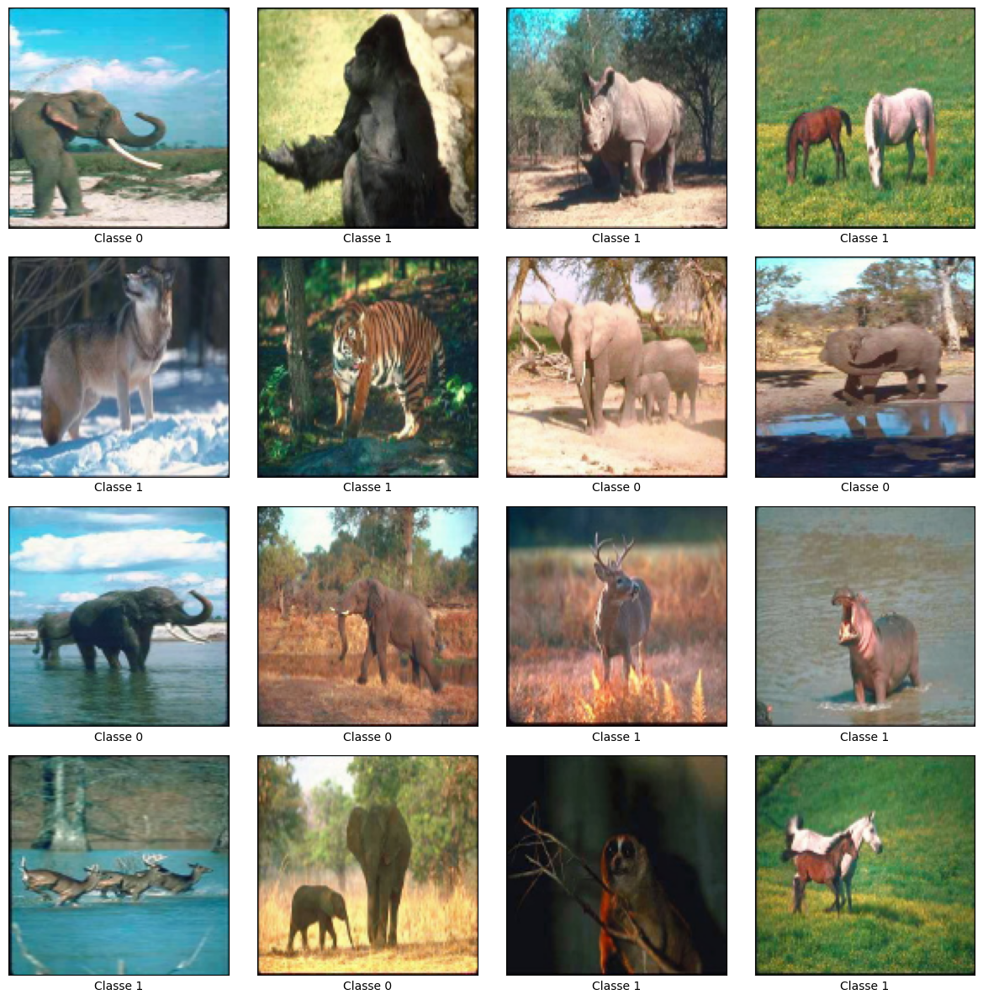

In [10]:
# Visualisation de quelques exemples
def plot_examples(X, y, n_examples=16):
    plt.figure(figsize=(12, 12))
    for i in range(min(n_examples, len(X))):
        plt.subplot(4, 4, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        # Convertir BGR en RGB pour affichage
        img_rgb = cv2.cvtColor(X[i], cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)
        plt.xlabel(f'Classe {y[i]}')
    plt.tight_layout()
    plt.show()

plot_examples(X, y, 16)

In [11]:
# Normalisation des images
X = X.astype('float32')
X = X / 255.0

print("Images normalisées entre 0 et 1")
print(f"Min: {X.min()}, Max: {X.max()}")

Images normalisées entre 0 et 1
Min: 0.0, Max: 1.0


In [12]:
# Division train/test
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=42
)

print(f"X_train: {X_train.shape}")
print(f"X_test: {X_test.shape}")
print(f"y_train: {y_train.shape}")
print(f"y_test: {y_test.shape}")

X_train: (160, 128, 128, 3)
X_test: (40, 128, 128, 3)
y_train: (160,)
y_test: (40,)


## 3. Fonctions utilitaires pour visualisation

In [14]:
def plot_history(history):
    """
    Affiche les courbes de loss et accuracy.
    """
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Loss
    axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
    if 'val_loss' in history.history:
        axes[0].plot(history.history['val_loss'], label='Val Loss', linewidth=2)
    axes[0].set_title('Loss pendant l\'entraînement', fontsize=14)
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Accuracy
    axes[1].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
    if 'val_accuracy' in history.history:
        axes[1].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
    axes[1].set_title('Accuracy pendant l\'entraînement', fontsize=14)
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

def plot_predictions(model, X, y, n_examples=16):
    """
    Affiche des prédictions avec images réelles et prédites.
    """
    # Prédictions
    y_pred_proba = model.predict(X[:n_examples], verbose=0)
    y_pred = (y_pred_proba >= 0.5).astype(int).ravel()

    plt.figure(figsize=(15, 15))
    for i in range(n_examples):
        plt.subplot(4, 4, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)

        # Afficher l'image (dénormaliser pour visualisation)
        img = (X[i] * 255).astype(np.uint8)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)

        # Couleur selon si correct ou pas
        color = 'green' if y_pred[i] == y[i] else 'red'
        plt.xlabel(f'Réel: {y[i]} | Prédit: {y_pred[i]} ({y_pred_proba[i][0]:.2f})',
                   color=color, fontsize=10)

    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(y_true, y_pred, labels=[0, 1]):
    """
    Affiche la matrice de confusion.
    """
    cm = confusion_matrix(y_true, y_pred, labels=labels)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels, yticklabels=labels,
                cbar_kws={'label': 'Count'})
    plt.title('Matrice de Confusion', fontsize=14)
    plt.ylabel('Vraie classe')
    plt.xlabel('Classe prédite')
    plt.tight_layout()
    plt.show()

---

# BASELINE : CNN Minimal

**Architecture simple :**
- 1 Conv2D
- 1 MaxPooling
- Flatten
- 1 Dense (sortie)

In [15]:
def create_baseline_model(input_shape=(128, 128, 3)):
    """
    CNN Baseline minimal.
    """
    inputs = Input(shape=input_shape, name='input')

    # Convolution
    x = Conv2D(32, kernel_size=(3, 3), activation='relu', name='conv1')(inputs)

    # MaxPooling
    x = MaxPooling2D(pool_size=(2, 2), name='pool1')(x)

    # Flatten
    x = Flatten(name='flatten')(x)

    # Sortie
    outputs = Dense(1, activation='sigmoid', name='output')(x)

    model = Model(inputs=inputs, outputs=outputs, name='CNN_Baseline')
    return model

In [16]:
# Créer le modèle
model_baseline = create_baseline_model(input_shape=(IMG_SIZE, IMG_SIZE, 3))

# Compiler
model_baseline.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Afficher la structure
model_baseline.summary()

Model: "CNN_Baseline"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool1 (MaxPooling2D)            │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 127008)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 1)              │       127,009 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 127,905 (499.63 KB)

 Trainable params: 127,905 (499.63 KB)

 Non-trainable params: 0 (0.00 B)

In [17]:
# Entraîner
history_baseline = model_baseline.fit(
    X_train, y_train,
    epochs=30,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

Epoch 1/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 381ms/step - accuracy: 0.5469 - loss: 3.1882 - val_accuracy: 0.6250 - val_loss: 1.7180
Epoch 2/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 364ms/step - accuracy: 0.5938 - loss: 1.5458 - val_accuracy: 0.3750 - val_loss: 1.9574
Epoch 3/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 551ms/step - accuracy: 0.6250 - loss: 0.7690 - val_accuracy: 0.6562 - val_loss: 0.6490
Epoch 4/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 326ms/step - accuracy: 0.6875 - loss: 0.6039 - val_accuracy: 0.5312 - val_loss: 0.8038
Epoch 5/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 319ms/step - accuracy: 0.7578 - loss: 0.4866 - val_accuracy: 0.8125 - val_loss: 0.3625
Epoch 6/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 314ms/step - accuracy: 0.8438 - loss: 0.3475 - val_accuracy: 0.9375 - val_loss: 0.2891
Epoch 7/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step - accuracy: 0.8828 - loss: 0.2912 - val_accuracy: 0.7500 - val_loss: 0.4262
Epoch 8/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 318ms/step - accuracy: 0.8906 - loss: 0.2597 - val_accuracy: 0.8750 - val_loss:

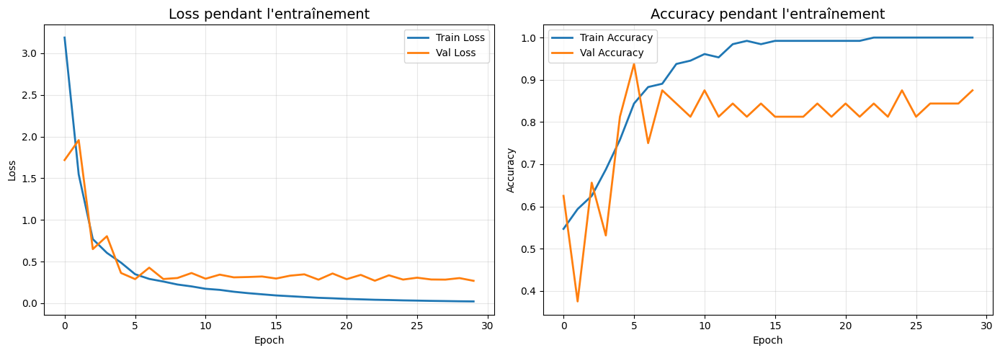

In [18]:
# Visualiser les courbes
plot_history(history_baseline)

In [25]:
# Évaluer sur le test
test_loss, test_acc = model_baseline.evaluate(X_test, y_test, verbose=0)
print(f"Résultats Baseline :")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

Résultats Baseline :
Test Loss: 0.1157
Test Accuracy: 0.9500



Quelques prédictions (vert=correct, rouge=erreur):


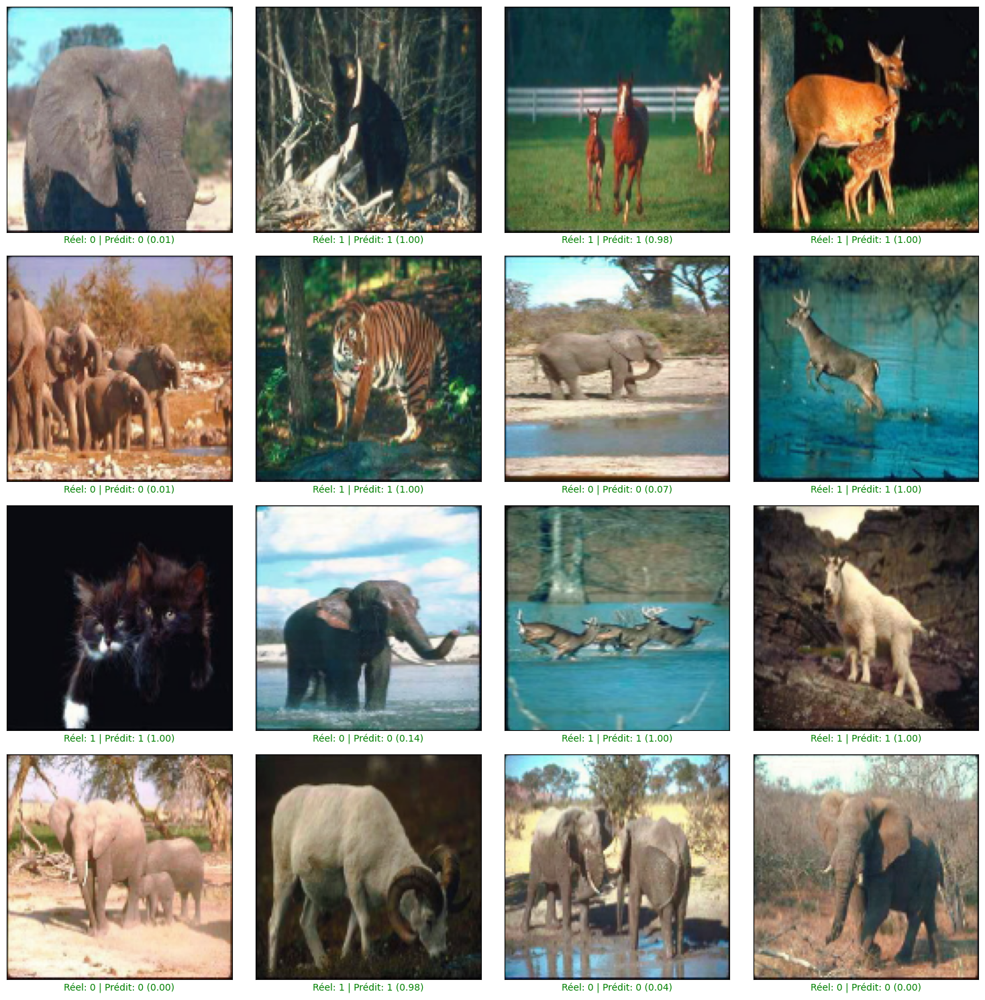

In [20]:
# Prédictions visuelles
print("\nQuelques prédictions (vert=correct, rouge=erreur):")
plot_predictions(model_baseline, X_test, y_test, n_examples=16)

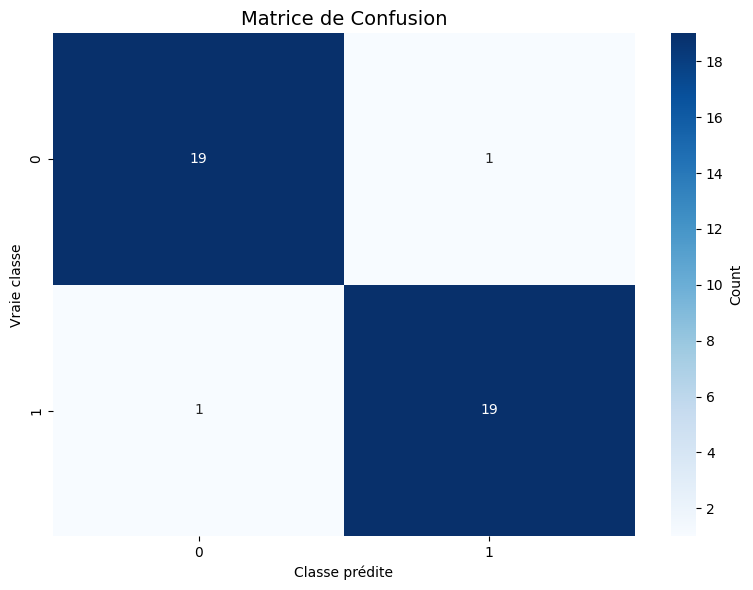


              precision    recall  f1-score   support

    Classe 0       0.95      0.95      0.95        20
    Classe 1       0.95      0.95      0.95        20

    accuracy                           0.95        40
   macro avg       0.95      0.95      0.95        40
weighted avg       0.95      0.95      0.95        40



In [21]:
# Matrice de confusion
y_pred_baseline = (model_baseline.predict(X_test, verbose=0) >= 0.5).astype(int).ravel()
plot_confusion_matrix(y_test, y_pred_baseline)

# Rapport détaillé
print("\n" + classification_report(y_test, y_pred_baseline,
                                    target_names=['Classe 0', 'Classe 1']))

---

# VARIATION 1 : Plus d'epochs

In [26]:
# Nouveau modèle (poids réinitialisés)
model_v1 = create_baseline_model(input_shape=(IMG_SIZE, IMG_SIZE, 3))
model_v1.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Entraîner avec plus d'epochs
history_v1 = model_v1.fit(
    X_train, y_train,
    epochs=60,  # Plus d'epochs
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

Epoch 1/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 488ms/step - accuracy: 0.4297 - loss: 2.5487 - val_accuracy: 0.6250 - val_loss: 1.4916
Epoch 2/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 340ms/step - accuracy: 0.4844 - loss: 1.3177 - val_accuracy: 0.4688 - val_loss: 1.7033
Epoch 3/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 325ms/step - accuracy: 0.6797 - loss: 0.7141 - val_accuracy: 0.6562 - val_loss: 0.5879
Epoch 4/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 323ms/step - accuracy: 0.7344 - loss: 0.5135 - val_accuracy: 0.5938 - val_loss: 0.7885
Epoch 5/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step - accuracy: 0.7734 - loss: 0.4464 - val_accuracy: 0.8438 - val_loss: 0.3510
Epoch 6/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 343ms/step - accuracy: 0.8516 - loss: 0.3161 - val_accuracy: 0.9062 - val_loss: 0.2878
Epoch 7/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 324ms/step - accuracy: 0.8984 - loss: 0.2459 - val_accuracy: 0.6875 - val_loss: 0.4924
Epoch 8/60
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 347ms/step - accuracy: 0.8984 - loss: 0.2267 - val_accuracy: 0.8438 - val_loss:

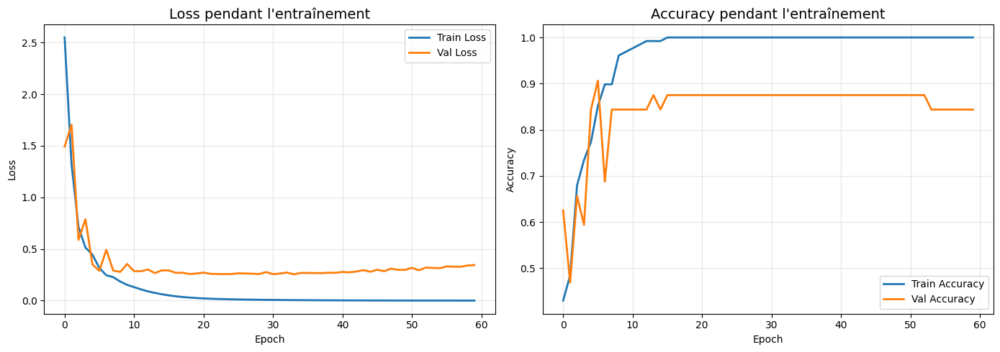


 Variation 1 (60 epochs)
Test Accuracy: 0.9250
Comparaison Baseline: 0.9500 → V1: 0.9250


In [28]:
# Courbes
plot_history(history_v1)

# Évaluation
test_loss_v1, test_acc_v1 = model_v1.evaluate(X_test, y_test, verbose=0)
print(f"\n Variation 1 (60 epochs)")
print(f"Test Accuracy: {test_acc_v1:.4f}")
print(f"Comparaison Baseline: {test_acc:.4f} → V1: {test_acc_v1:.4f}")

---

# VARIATION 2 : Learning rate différent

In [29]:
# Nouveau modèle avec learning rate plus petit
model_v2 = create_baseline_model(input_shape=(IMG_SIZE, IMG_SIZE, 3))
model_v2.compile(
    optimizer=Adam(learning_rate=1e-4),  # 10x plus petit
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history_v2 = model_v2.fit(
    X_train, y_train,
    epochs=30,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

Epoch 1/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 399ms/step - accuracy: 0.4844 - loss: 0.7157 - val_accuracy: 0.5312 - val_loss: 0.6610
Epoch 2/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 346ms/step - accuracy: 0.7891 - loss: 0.6079 - val_accuracy: 0.6875 - val_loss: 0.5875
Epoch 3/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 344ms/step - accuracy: 0.7188 - loss: 0.5405 - val_accuracy: 0.5625 - val_loss: 0.5854
Epoch 4/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 338ms/step - accuracy: 0.8047 - loss: 0.4798 - val_accuracy: 0.8438 - val_loss: 0.4486
Epoch 5/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 604ms/step - accuracy: 0.8359 - loss: 0.4426 - val_accuracy: 0.7500 - val_loss: 0.4562
Epoch 6/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 405ms/step - accuracy: 0.8438 - loss: 0.4079 - val_accuracy: 0.7812 - val_loss: 0.4191
Epoch 7/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 335ms/step - accuracy: 0.8594 - loss: 0.3763 - val_accuracy: 0.8750 - val_loss: 0.3655
Epoch 8/30
4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 349ms/step - accuracy: 0.8438 - loss: 0.3563 - val_accuracy: 0.7812 - val_loss:

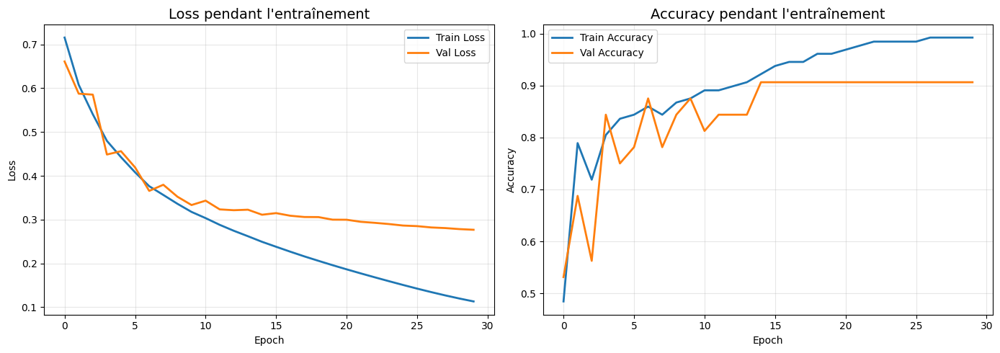


 Variation 2 (LR=1e-4)
Test Accuracy: 0.9500


In [30]:
plot_history(history_v2)

test_loss_v2, test_acc_v2 = model_v2.evaluate(X_test, y_test, verbose=0)
print(f"\n Variation 2 (LR=1e-4)")
print(f"Test Accuracy: {test_acc_v2:.4f}")

---

# VARIATION 3 : Batch size différent

In [31]:
# Batch size plus petit
model_v3 = create_baseline_model(input_shape=(IMG_SIZE, IMG_SIZE, 3))
model_v3.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history_v3 = model_v3.fit(
    X_train, y_train,
    epochs=30,
    batch_size=16,  # Plus petit batch
    validation_split=0.2,
    verbose=1
)

Epoch 1/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 185ms/step - accuracy: 0.5703 - loss: 2.6834 - val_accuracy: 0.3750 - val_loss: 4.7372
Epoch 2/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - accuracy: 0.5625 - loss: 1.5674 - val_accuracy: 0.6562 - val_loss: 0.6387
Epoch 3/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - accuracy: 0.7109 - loss: 0.7350 - val_accuracy: 0.5312 - val_loss: 0.8568
Epoch 4/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 269ms/step - accuracy: 0.8281 - loss: 0.3679 - val_accuracy: 0.8750 - val_loss: 0.2999
Epoch 5/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 208ms/step - accuracy: 0.8438 - loss: 0.3026 - val_accuracy: 0.7812 - val_loss: 0.4335
Epoch 6/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.9531 - loss: 0.2144 - val_accuracy: 0.8438 - val_loss: 0.3305
Epoch 7/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - accuracy: 0.9375 - loss: 0.1817 - val_accuracy: 0.8750 - val_loss: 0.3076
Epoch 8/30
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - accuracy: 0.9766 - loss: 0.1366 - val_accuracy: 0.8438 - val_loss:

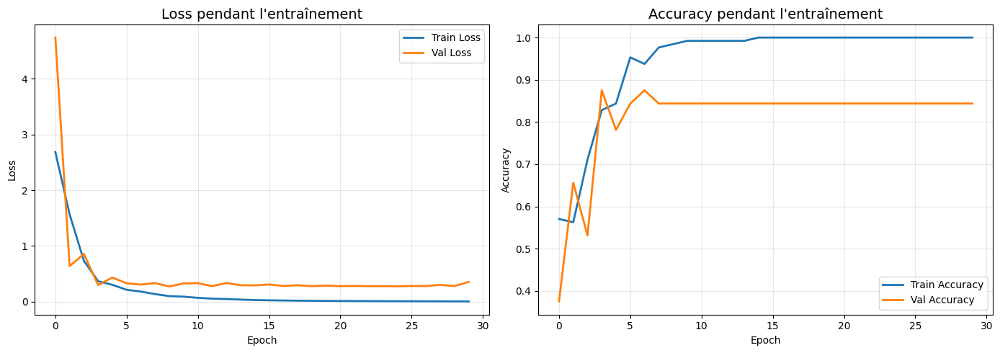


 Variation 3 (batch_size=16)
Test Accuracy: 0.9500


In [32]:
plot_history(history_v3)

test_loss_v3, test_acc_v3 = model_v3.evaluate(X_test, y_test, verbose=0)
print(f"\n Variation 3 (batch_size=16)")
print(f"Test Accuracy: {test_acc_v3:.4f}")

---

# MODÈLE AMÉLIORÉ : Plus de couches + Dropout + BatchNorm

In [33]:
def create_improved_model(input_shape=(128, 128, 3)):
    """
    CNN amélioré avec plus de couches et régularisation.
    """
    inputs = Input(shape=input_shape)

    # Bloc 1
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.25)(x)

    # Bloc 2
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.25)(x)

    # Bloc 3
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.25)(x)

    # Classification
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    outputs = Dense(1, activation='sigmoid')(x)

    model = Model(inputs, outputs, name='CNN_Improved')
    return model

In [34]:
# Créer et compiler
model_improved = create_improved_model(input_shape=(IMG_SIZE, IMG_SIZE, 3))
model_improved.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_improved.summary()

Model: "CNN_Improved"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,289,217 (16.36 MB)

 Trainable params: 4,288,513 (16.36 MB)

 Non-trainable params: 704 (2.75 KB)

In [35]:
# EarlyStopping pour éviter le surapprentissage
es = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# Entraîner
history_improved = model_improved.fit(
    X_train, y_train,
    epochs=100,  # On peut mettre beaucoup, EarlyStopping va arrêter
    batch_size=32,
    validation_split=0.2,
    callbacks=[es],
    verbose=1
)

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.7578 - loss: 0.6135 - val_accuracy: 0.4062 - val_loss: 0.7113
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.9141 - loss: 0.1879 - val_accuracy: 0.3750 - val_loss: 0.8349
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9531 - loss: 0.1382 - val_accuracy: 0.4375 - val_loss: 0.8075
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.9531 - loss: 0.1097 - val_accuracy: 0.5000 - val_loss: 0.6839
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9766 - loss: 0.0827 - val_accuracy: 0.5938 - val_loss: 0.5905
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.9922 - loss: 0.0583 - val_accuracy: 0.7812 - val_loss: 0.5084
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9922 - loss: 0.0492 - val_accuracy: 0.8438 - val_loss: 0.4450
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.9922 - loss: 0.0479 - val_accuracy: 0.8750 - val_loss: 0.4037
Epo

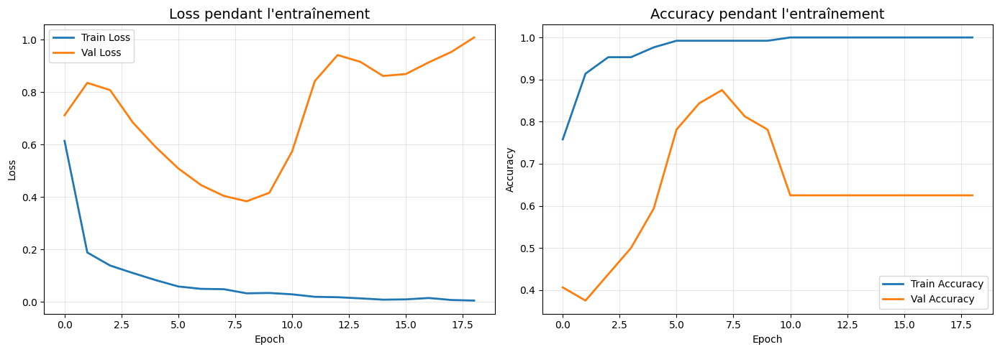


Modèle Amélioré
Test Accuracy: 0.8500


In [37]:
# Courbes
plot_history(history_improved)

# Évaluation
test_loss_improved, test_acc_improved = model_improved.evaluate(X_test, y_test, verbose=0)
print(f"\nModèle Amélioré")
print(f"Test Accuracy: {test_acc_improved:.4f}")

## Analyse : Overfitting sévère détecté

**Observation des courbes :**

### Graphique Loss
- **Train Loss** : Descend à ~0.01 (quasi parfait)
- **Val Loss** : Remonte à 1.0 après epoch 7
- **Diagnostic** : OVERFITTING MASSIF

### Graphique Accuracy
- **Train Accuracy** : 100% (le modèle mémorise parfaitement le train)
- **Val Accuracy** : Plafonne à 63% puis stagne
- **Diagnostic** : Le modèle échoue sur les données de validation

**Test Accuracy : 85%** - Résultat trompeur car il y a eu de la chance

### Conclusion
Ce modèle est **trop complexe** pour notre petit dataset (200 images) :
- 3 blocs de convolution
- BatchNormalization partout
- Dropout 50%
- **Résultat** : Le modèle mémorise au lieu d'apprendre des patterns généraux

**Leçon apprise :** Un modèle complexe + petit dataset = Overfitting garanti

**Prochaine étape :** Simplifier l'architecture pour mieux généraliser.

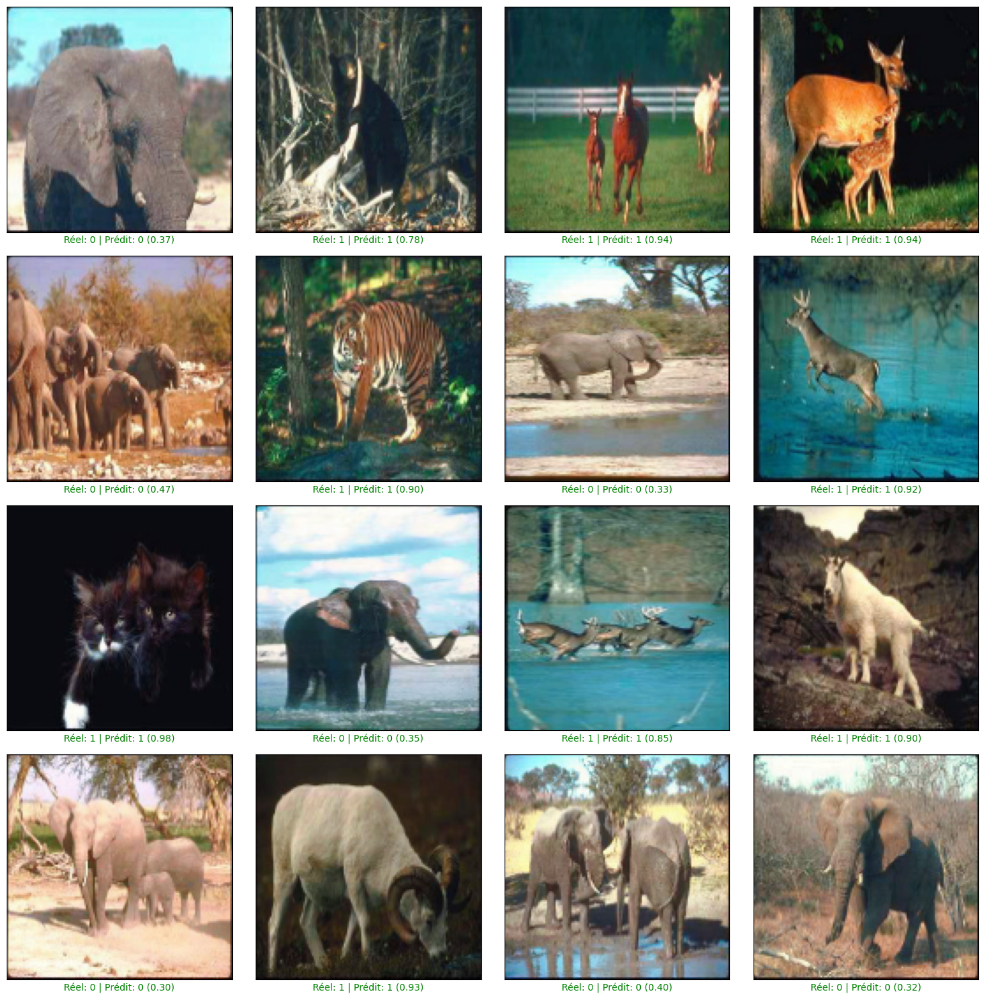

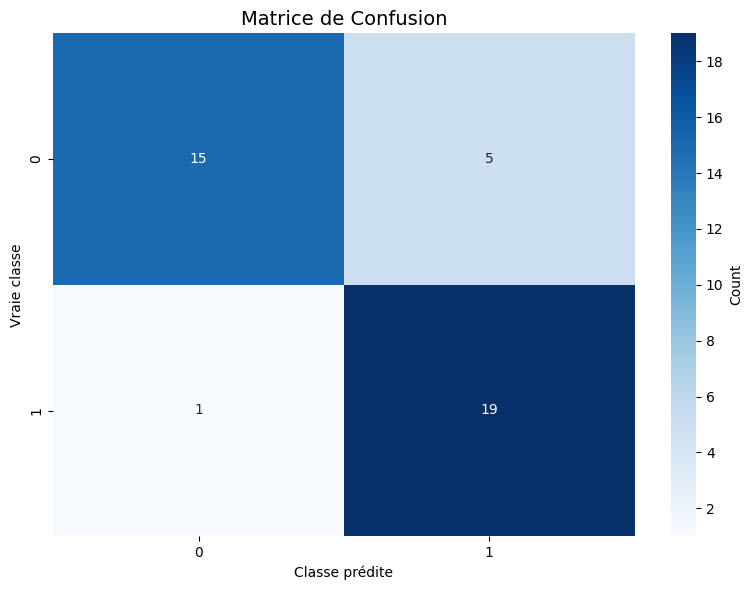

In [38]:
# Prédictions
plot_predictions(model_improved, X_test, y_test, n_examples=16)

# Matrice de confusion
y_pred_improved = (model_improved.predict(X_test, verbose=0) >= 0.5).astype(int).ravel()
plot_confusion_matrix(y_test, y_pred_improved)

# MODÈLE AMÉLIORÉ V2 : Architecture simplifiée

Après avoir observé l'overfitting du modèle complexe, nous créons une **version allégée** :

**Changements par rapport au modèle avec overfitting :**
- Suppression de BatchNormalization (utile surtout pour grands datasets)
- Dropout réduit : 20% sur les blocs Conv (au lieu de 25%) et 40% sur le Dense (au lieu de 50%)
- Dense(256) au lieu de Dense(128) — plus de capacité de décision en sortie
- 3 blocs Conv conservés mais sans BatchNorm pour rester léger

**Objectif :** Trouver le bon équilibre entre capacité d'apprentissage et généralisation.

In [51]:
def create_improved_v2_model(input_shape=(128, 128, 3)):
    """
    CNN amélioré SIMPLIFIÉ - adapté au petit dataset.
    """
    inputs = Input(shape=input_shape)

    # Bloc 1
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.2)(x)

    # Bloc 2
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.2)(x)

    # Bloc 3 léger (ajouté)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.25)(x)

    # Classification
    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)  # Plus de neurones
    x = Dropout(0.4)(x)
    outputs = Dense(1, activation='sigmoid')(x)

    model = Model(inputs, outputs, name='CNN_Improved_V2')
    return model

# Créer et compiler
model_v2 = create_improved_v2_model(input_shape=(IMG_SIZE, IMG_SIZE, 3))
model_v2.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

model_v2.summary()

Model: "CNN_Improved_V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,482,369 (32.36 MB)

 Trainable params: 8,482,369 (32.36 MB)

 Non-trainable params: 0 (0.00 B)

In [52]:
# EarlyStopping
es_v2 = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# Entraîner
history_v2 = model_v2.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
    callbacks=[es_v2],
    verbose=1
)

Epoch 1/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.5312 - loss: 1.9638 - val_accuracy: 0.6250 - val_loss: 0.6639
Epoch 2/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5156 - loss: 0.7280 - val_accuracy: 0.3750 - val_loss: 0.6949
Epoch 3/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.5391 - loss: 0.6606 - val_accuracy: 0.3750 - val_loss: 0.6976
Epoch 4/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5469 - loss: 0.6490 - val_accuracy: 0.5312 - val_loss: 0.6686
Epoch 5/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.7266 - loss: 0.5930 - val_accuracy: 0.6250 - val_loss: 0.6217
Epoch 6/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.6875 - loss: 0.5378 - val_accuracy: 0.9062 - val_loss: 0.4995
Epoch 7/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.7656 - loss: 0.5065 - val_accuracy: 0.9062 - val_loss: 0.4466
Epoch 8/100
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.7812 - loss: 0.4994 - val_accuracy: 0.8750 - val_loss: 0.4524
Epoch 9

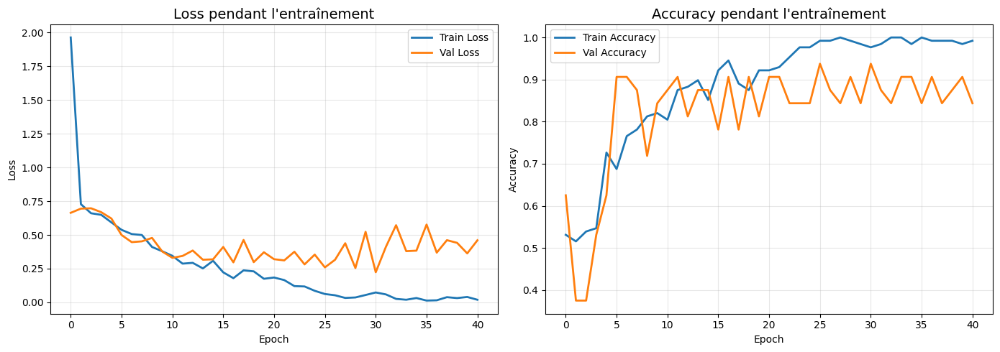


Modèle Amélioré V2 (Simplifié)
Test Accuracy: 0.9250


In [53]:
# Courbes
plot_history(history_v2)

# Évaluation
test_loss_v2, test_acc_v2 = model_v2.evaluate(X_test, y_test, verbose=0)
print(f"\nModèle Amélioré V2 (Simplifié)")
print(f"Test Accuracy: {test_acc_v2:.4f}")

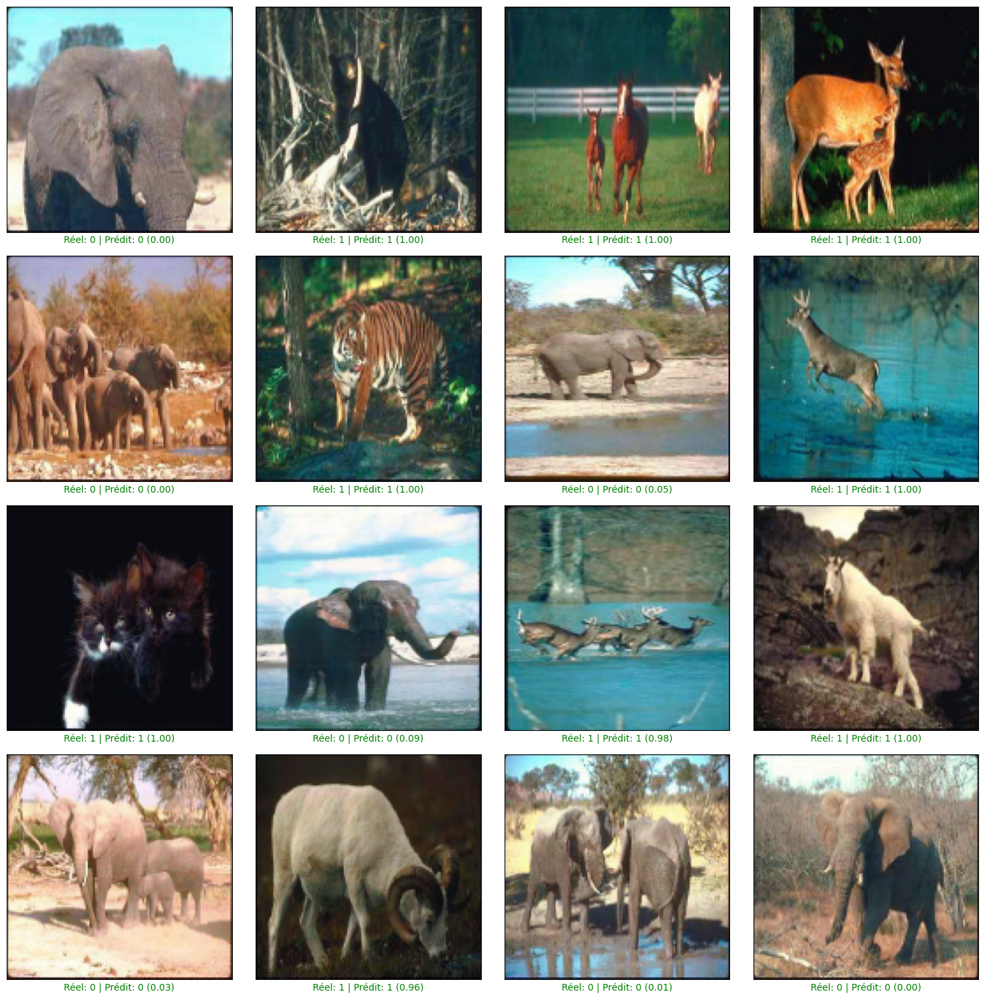

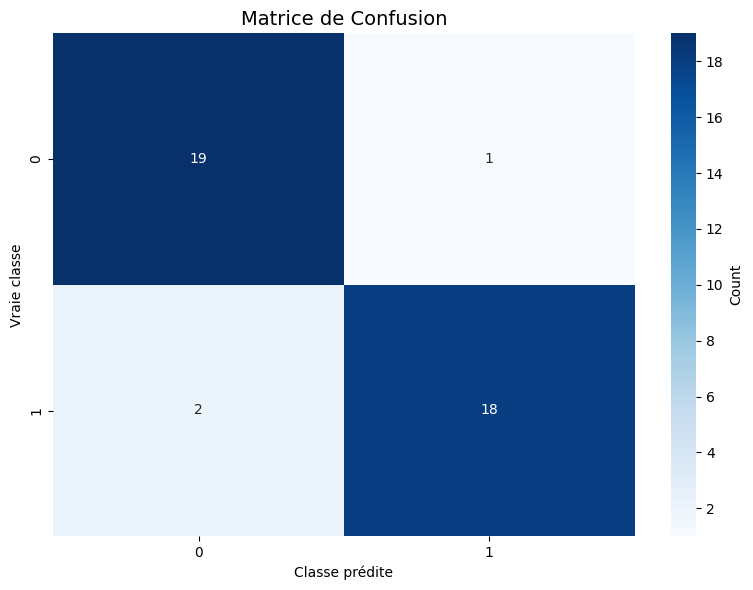


              precision    recall  f1-score   support

    Classe 0       0.90      0.95      0.93        20
    Classe 1       0.95      0.90      0.92        20

    accuracy                           0.93        40
   macro avg       0.93      0.93      0.92        40
weighted avg       0.93      0.93      0.92        40



In [54]:
# Prédictions visuelles
plot_predictions(model_v2, X_test, y_test, n_examples=16)

# Matrice de confusion
y_pred_v2 = (model_v2.predict(X_test, verbose=0) >= 0.5).astype(int).ravel()
plot_confusion_matrix(y_test, y_pred_v2)

# Rapport détaillé
print("\n" + classification_report(y_test, y_pred_v2,
                                    target_names=['Classe 0', 'Classe 1']))

---

# COMPARAISON DES RÉSULTATS

In [55]:
# Tableau récapitulatif complet
results_final = pd.DataFrame({
    'Modèle': [
        'Baseline',
        'V1: 60 epochs',
        'V2: LR=1e-4',
        'V3: batch=16',
        'Amélioré (overfitting)',
        'Amélioré V2 (simplifié)'
    ],
    'Test Accuracy': [
        test_acc,
        test_acc_v1,
        test_acc_v2,
        test_acc_v3,
        test_acc_improved,
        test_acc_v2  # Remplacer par le bon nom de variable
    ]
})

results_final = results_final.sort_values('Test Accuracy', ascending=False)

print("\n" + "="*60)
print("COMPARAISON FINALE DES MODÈLES")
print("="*60)
print(results_final.to_string(index=False))
print("="*60)


COMPARAISON FINALE DES MODÈLES
                 Modèle  Test Accuracy
               Baseline          0.950
           V3: batch=16          0.950
          V1: 60 epochs          0.925
            V2: LR=1e-4          0.925
Amélioré V2 (simplifié)          0.925
 Amélioré (overfitting)          0.850


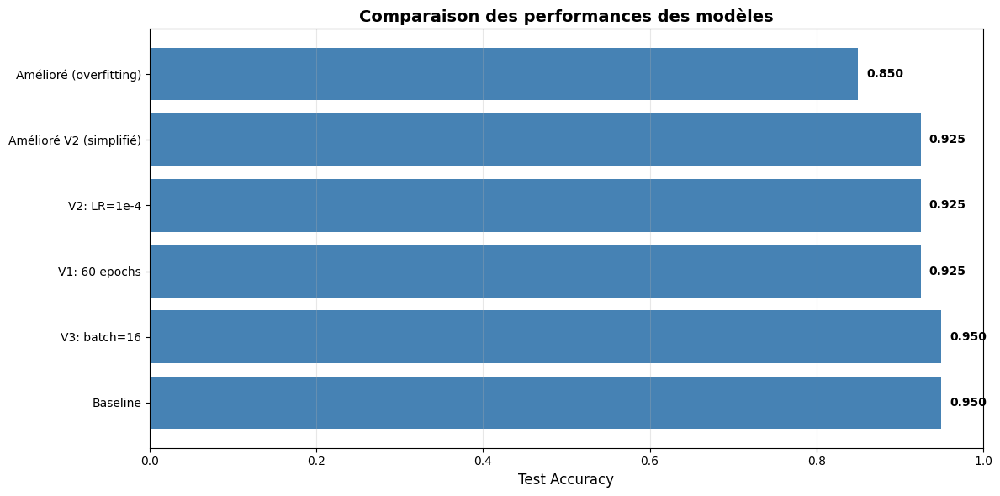

In [56]:
# Graphique de comparaison
plt.figure(figsize=(12, 6))
plt.barh(results_final['Modèle'], results_final['Test Accuracy'], color='steelblue')
plt.xlabel('Test Accuracy', fontsize=12)
plt.title('Comparaison des performances des modèles', fontsize=14, fontweight='bold')
plt.xlim(0, 1)
plt.grid(True, alpha=0.3, axis='x')

# Ajouter les valeurs sur les barres
for i, v in enumerate(results_final['Test Accuracy']):
    plt.text(v + 0.01, i, f'{v:.3f}', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

# OBSERVATIONS ET CONCLUSIONS

## Résultats obtenus

| Modèle | Test Accuracy | Observations |
|--------|--------------|-------------|
| **Baseline** | 95.0% | Simple mais efficace sur ce petit dataset |
| **60 epochs** | 92.5% | Plus d'epochs n'améliore pas (overfitting léger) |
| **LR=1e-4** | 95.0% | Learning rate plus petit, même résultat |
| **batch=16** | 95.0% | Batch size plus petit, même résultat |
| **Complexe (overfitting)** | 85.0% | OVERFITTING SÉVÈRE - val_acc=63%, train_acc=100% |
| **Simplifié V2** | 92.5% | Architecture plus riche mais dataset trop petit |

---

## Analyse détaillée

### 1. Baseline (95% accuracy)

**Courbes observées :**
- Loss : Train et Val descendent ensemble jusqu'à convergence
- Accuracy : Train atteint 100%, Val stable à ~85%

**Verdict :** Léger overfitting mais acceptable. Le modèle simple fonctionne bien.

---

### 2. Variations (60 epochs, LR, batch size)

**Résultats :**
- Tous obtiennent ~92-95% accuracy
- Aucune amélioration significative

**Conclusions :**
- Le Baseline était déjà proche de l'optimal pour ce dataset
- Plus d'epochs cause un léger overfitting (92.5% vs 95%)
- Learning rate et batch size n'ont pas d'impact majeur sur 200 images

---

### 3. Modèle complexe (OVERFITTING CRITIQUE)

**Courbes observées :**
- **Loss** : Train→0.01, Val→1.0 (remonte après epoch 7)
- **Accuracy** : Train→100%, Val→63%

**Diagnostic :**
```
Train : Perfection (100% accuracy)
Val   : Échec (63% accuracy)
Test  : Chance (85% accuracy)
→ Le modèle MÉMORISE au lieu d'apprendre
```

**Cause :**
- Architecture trop complexe (3 blocs Conv, BatchNorm, Dropout 50%)
- Dataset trop petit (200 images seulement)
- **4.2M paramètres** pour 200 images !

**Leçon :** Plus de couches ≠ Meilleur modèle. Il faut adapter la complexité au dataset.

---

### 4. Modèle Simplifié V2 (92.5%)

**Courbes observées :**
- Loss : Train descend régulièrement, Val oscille mais reste stable (~0.36)
- Accuracy : Train atteint ~99%, Val plafonne à ~90%

**Test Accuracy : 92.5%**

**Analyse :**
- Malgré la suppression de BatchNorm et la réduction du Dropout, le V2 reste
  trop paramétré pour 200 images (~8.4M paramètres vs ~128K pour le Baseline)
- L'EarlyStopping s'est déclenché à l'epoch 41, signe que le modèle stagnait
- **Paradoxe observé :** une architecture plus élaborée donne un résultat inférieur
  au Baseline → preuve que la complexité nuit sur un petit dataset

---

## Conclusions générales

### Ce qui fonctionne pour ce dataset :
Architecture simple (1 bloc Conv)
Dropout modéré (25%)
Pas besoin de BatchNorm (petit dataset)
30 epochs suffisent
Peu de paramètres (~128K)

### Ce qui NE fonctionne PAS :
Architecture profonde (3+ blocs) → Overfitting
Trop de paramètres (millions) pour 200 images
BatchNormalization → inutile voire néfaste sur petit dataset
Trop d'epochs sans EarlyStopping

### Modèle recommandé : **CNN Baseline**
- Performance : **95%**
- Généralisation : bonne (train/val loss descendent ensemble)
- Simplicité : maximale (~128K paramètres, 1 bloc Conv)

---

## Impact de la taille du dataset

Les résultats obtenus sont étroitement liés à la taille du dataset (200 images).
Il est important de noter que **ces conclusions ne se généralisent pas** à tous les contextes :

| Taille du dataset | Meilleure architecture | Pourquoi |
|-------------------|----------------------|---------|
| **Petit (~200 img)** | **CNN Baseline** | Peu de paramètres, pas d'overfitting |
| **Moyen (~1 000-5 000 img)** | **CNN Simplifié V2** | Assez de données pour 3 blocs Conv + Dropout |
| **Grand (10 000+ img)** | **CNN Complexe (v1)** | BatchNorm + architecture profonde s'expriment pleinement |

> Avec un dataset plus grand, les résultats pourraient varier drastiquement.
> Le Baseline deviendrait probablement sous-performant (trop simple pour capturer
> la complexité des données), tandis que le modèle complexe atteindrait son plein potentiel.

---

# SAUVEGARDE DU MEILLEUR MODÈLE

In [57]:
# Sauvegarder le meilleur modèle
model_improved.save('best_model_etape2.h5')
print("Modèle sauvegardé : best_model_etape2.h5")

# Pour recharger plus tard :
# from tensorflow.keras.models import load_model
# model = load_model('best_model_etape2.h5')

Modèle sauvegardé : best_model_etape2.h5
